### Compute module allegiance for each stage of the task

In [1]:
# Adding GDa to path
import os
import sys

import matplotlib.pyplot as plt
import numpy as np
import xarray as xr

sys.path.insert(1, "/home/vinicius/storage1/projects/GrayData-Analysis")

from tqdm import tqdm

from GDa.flatmap.flatmap import flatmap
from GDa.net.layerwise import compute_network_partition
from GDa.net.temporal import compute_allegiance_matrix
from GDa.net.util import convert_to_adjacency
from GDa.temporal_network import temporal_network

#### Loading temporal network

In [2]:
_ROOT = os.path.expanduser("~/storage1/projects/GrayData-Analysis")

# Path in which to save coherence data
_RESULTS = os.path.join("Results", "lucy", "141017", "session01")

coh_sig_file = f"coh_k_0.3_multitaper_at_cue_surr.nc"
wt = None

In [3]:
net = temporal_network(
    coh_file=f"coh_k_0.3_multitaper_at_cue.nc",
    coh_sig_file=coh_sig_file,
    wt=wt,
    date="141017",
    trial_type=[1],
    behavioral_response=[1],
)

#### Average over sessions

In [4]:
# Stage masks
net.create_stage_masks(flatten=True)

In [5]:
coh = []
attrs = net.super_tensor.attrs
net.super_tensor = net.super_tensor.stack(samples=("trials", "times"))
for stage in tqdm(net.s_mask.keys()):
    coh += [net.super_tensor.isel(samples=net.s_mask[stage].data).mean("samples")]

100%|██████████████████████████████████████████████████████| 5/5 [00:22<00:00,  4.52s/it]


In [6]:
net.super_tensor = xr.concat(coh, "times").transpose("roi", "freqs", "times")
net.super_tensor.attrs = attrs
net.super_tensor = net.super_tensor.expand_dims("trials", 2)

In [4]:
net.convert_to_adjacency()

In [ ]:
partition, modularity = [], []
for f in range(net.A.sizes["freqs"]):
    p, m = compute_network_partition(
        net.A.mean(dim="trials", keepdims=True).isel(freqs=f)
    )
    partition += [p]
    modularity += [m]
partition = xr.concat(partition, "freqs")
modularity = xr.concat(modularity, "freqs")

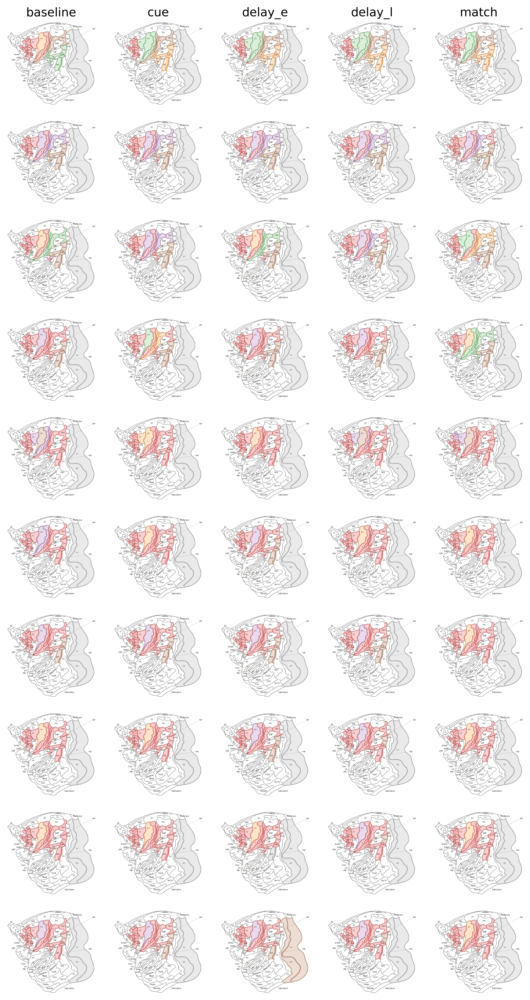

In [9]:
###########################################################################
# Plot in the flatmap
###########################################################################

# Define sub-cortical areas names
sca = np.array(["thal", "putamen", "claustrum", "caudate"])

# Get area names
areas = net.A.sources.data
areas = [a.lower() for a in areas]
index = np.where(np.isin(areas, sca))
_areas_nosca = np.delete(areas, index)


n_freqs = partition.sizes["freqs"]
n_times = partition.sizes["times"]

# Name of each stage to use in plot titles
stage = ["baseline", "cue", "delay_e", "delay_l", "match"]

# Create canvas in which the flatmaps will be drawn
fig = plt.figure(figsize=(8, 15), dpi=600)
gs1 = fig.add_gridspec(
    nrows=n_freqs, ncols=n_times, left=0.05, right=0.95, bottom=0.05, top=0.95
)

# Will store the axes of the figure
ax, ax_cbar = [], []
# Plot flatmap for different freuquencies and times
for f in range(n_freqs):
    vmin = None  # mi_sig.isel(freqs=f).min()
    vmax = None  # mi_sig.isel(freqs=f).max()
    for t in range(n_times):
        ax += [plt.subplot(gs1[t + n_times * f])]  # Flatmap axis
        # Get values to plot in the flatmap
        values = partition.isel(times=t)
        values = values.isel(freqs=f).data
        # Delete values for subcortical areas
        values = np.delete(values, index)
        #
        _a, _v = [], []
        for area in np.unique(_areas_nosca):
            idx = _areas_nosca == area
            counts = np.bincount(values[idx])
            _a += [area]
            _v += [np.argmax(counts)]
        # Instantiate flatmap
        fmap = flatmap(_v, _a)
        # Only plot colorbar for last column
        fmap.plot(
            ax[t + n_times * f],
            ax_colorbar=None,
            cbar_title=None,
            colormap="Set1",
            vmin=vmin,
            vmax=vmax,
        )
        # Place titles
        if f == 0:
            plt.title(stage[t], fontsize=12)